# Datos de energía eólica

In [1]:
# Librerías empleadas
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Carga de los datos

In [2]:
# Fichero de carga
file = 'data\data_original\wind_farms\Wind farm site 1 (Nominal capacity-99MW).xlsx'

# Cargamos los datos desde excel
# Hemos encontrado que el -99 y 0.001 identifica los valos nulos
data = pd.read_excel(file, na_values=[-99, 0.001])

# Mostramos los datos cargados
data.head()

,Time(year-month-day h:m:s),Wind speed at height of 10 meters (m/s),Wind direction at height of 10 meters (˚),Wind speed at height of 30 meters (m/s),Wind direction at height of 30 meters (˚),Wind speed at height of 50 meters (m/s),Wind direction at height of 50 meters (˚),Wind speed - at the height of wheel hub(m/s),Wind speed - at the height of wheel hub (˚),Air temperature (°C),Atmosphere (hpa),Relative humidity (%),Power (MW)
0,2019-01-01 00:00:00,2.209,81.317,1.991,74.814,2.094,77.667,2.494,74.500,-13.484,889.867,76.320,0.254383
1,2019-01-01 00:15:00,1.828,77.460,1.698,75.048,1.757,88.733,1.882,74.367,-13.691,889.575,76.757,0.329703
2,2019-01-01 00:30:00,2.193,86.700,2.313,84.688,2.344,89.100,2.350,NaN,-13.766,889.942,76.981,0.296306
3,2019-01-01 00:45:00,2.654,78.160,2.494,74.939,2.574,87.267,2.808,82.733,-13.691,889.675,76.821,0.187590
4,2019-01-01 01:00:00,2.249,94.297,2.192,91.140,2.558,96.900,2.924,92.967,-13.447,890.025,74.571,0.081005


## Análisis Exploratorio

Se explican las variables del dataset de la siguiente manera:

- **Wind speed (m/s)**: Indica la velocidad del viento en metros por segundo a diferentes alturas, incluyendo 10, 30, 50 metros y la altura de la turbina (85 m).

- **Wind direction**: Indica la dirección del viento en grados, medida a diferentes alturas, incluyendo 10, 30, 50 metros y la altura de la turbina.

- **Air temperature (°C)**: Es la temperatura del aire en grados Celsius en el momento del registro.

- **Atmosphere (hPa)**: Es la presión atmosférica en hectopascales.

- **Relative humiditya (%)**: Es el porcentaje de humedad relativa en el aire en el momento del registro.

- **Power (MW)**: Es la cantidad de energía generada en megavatios durante el período de tiempo correspondiente.

Todas ellas son de tipo numérico.

In [3]:
# Mostramos las columnas y filas del dataset original
print(f'El dataset tiene {data.shape[0]} filas y {data.shape[1]} columnas')

El dataset tiene 70176 filas y 13 columnas


## Preprocesamiento y gestión de las variables

### Variables de tiempo

In [4]:
# Transformamos la columna a tipo fecha
data['Time(year-month-day h:m:s)'] = pd.to_datetime(data['Time(year-month-day h:m:s)'], format='%Y-%m-%d %H:%M:%S')

# Cambiamos los nombre de las columns
data = data.rename(columns={'Wind speed - at the height of wheel hub (˚)': 'Wind direction - at the height of wheel hub (˚)', "Time(year-month-day h:m:s)":"Time"})
# Denotamos la fecha como el indice de los datos ya que nos ayudará a realizar el estudio
data = data.set_index('Time')

### NA Values

In [5]:
# Mostrasmos la cantidad de valores nulos
data.isnull().sum()

Wind speed at height of 10 meters (m/s)             923
Wind direction at height of 10 meters (˚)           270
Wind speed at height of 30 meters (m/s)            2529
Wind direction at height of 30 meters (˚)           321
Wind speed at height of 50 meters (m/s)            2377
Wind direction at height of 50 meters (˚)           334
Wind speed - at the height of wheel hub(m/s)       1259
Wind direction - at the height of wheel hub (˚)     362
Air temperature  (°C)                               252
Atmosphere (hpa)                                    230
Relative humidity (%)                               230
Power (MW)                                          206
dtype: int64

#### Imputación valores nulos

Vamos a imputar los valores nulos nulos creando una línea entre los puntos de datos más cercanos. Además, tiene un coste computacional bajo

In [6]:
# Imputamos los valores nulos creando una línea entre los puntos de datos más cercanos.
# Además, tiene un coste computacional bajo
data.interpolate(method='linear', inplace=True)

Comprobamos que ya no tenemos nulos

In [7]:
# No tenemos valores nulos
data.isnull().sum()

Wind speed at height of 10 meters (m/s)            0
Wind direction at height of 10 meters (˚)          0
Wind speed at height of 30 meters (m/s)            0
Wind direction at height of 30 meters (˚)          0
Wind speed at height of 50 meters (m/s)            0
Wind direction at height of 50 meters (˚)          0
Wind speed - at the height of wheel hub(m/s)       0
Wind direction - at the height of wheel hub (˚)    0
Air temperature  (°C)                              0
Atmosphere (hpa)                                   0
Relative humidity (%)                              0
Power (MW)                                         0
dtype: int64

Para continuar con el estudio vamos a resamplear los datos en cada hora, de esa manera eliminamos el ruido que podamos tener debido a la alta desagregación de los datos y evitaremos el sobreajuste del modelo durante el entrenamiento.

In [8]:
# Creamos un DataFrame vacío donde almacenaremos los datos agrupados por hora
hourly_data = pd.DataFrame()

# Iteramos sobre las columnas del DataFrame original para calcular el promedio de cada columna por hora
for column in data.columns:
    hourly_data[column] = data[column].resample('h').mean()

# Mostramos las primeras filas del DataFrame resultante
hourly_data.head()

# Añadimos dos nuevas columnas al DataFrame resultante: 'hour' para almacenar la hora del registro y 'day_of_year' para almacenar el día del año del registro.
# Estas columnas serán útiles para un análisis temporal de los datos.
hourly_data['hour'] = hourly_data.index.hour
hourly_data['day_of_year'] = hourly_data.index.dayofyear


### Análisis de distribuciones
#### Análisis univariante

In [9]:
# Mostrasmos un análisis estadístico inicial
hourly_data.describe()

,Wind speed at height of 10 meters (m/s),Wind direction at height of 10 meters (˚),Wind speed at height of 30 meters (m/s),Wind direction at height of 30 meters (˚),Wind speed at height of 50 meters (m/s),Wind direction at height of 50 meters (˚),Wind speed - at the height of wheel hub(m/s),Wind direction - at the height of wheel hub (˚),Air temperature (°C),Atmosphere (hpa),Relative humidity (%),Power (MW),hour,day_of_year
count,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000,17544.000000
mean,5.717897,222.901515,6.060147,220.805113,6.189507,222.035774,6.384457,217.259359,8.538317,889.527879,37.581272,23.408631,11.500000,183.250342
std,3.021789,69.290361,3.582770,75.544537,3.759751,78.879250,3.813263,81.359901,13.355461,2.383951,18.840329,23.762711,6.922384,105.513966
min,0.061500,7.004250,0.031375,4.016000,0.030000,0.133000,0.047500,4.379125,-23.664250,861.566750,1.637000,0.017264,0.000000,1.000000
25%,3.548250,208.623125,3.306750,190.342062,3.214250,171.877000,3.327562,151.352188,-3.254812,889.616750,22.371313,1.848583,5.750000,92.000000
50%,5.378125,235.396625,5.790875,244.489625,5.797750,250.881375,5.888750,247.927125,9.819125,889.760250,34.466000,15.168910,11.500000,183.000000
75%,7.156875,273.312750,8.036563,275.999500,8.338188,280.058250,8.560063,277.810187,19.727438,889.873000,51.548125,40.340024,17.250000,275.000000
max,22.428250,346.136750,24.798750,356.917750,25.468250,351.983500,26.328500,353.233250,35.467250,917.939750,92.373500,97.758340,23.000000,366.000000


Como podemos observar las diferentes variables de velocidad y dirección del viento son muy similares entre ellas, por lo que es posible que presenten multicolinearidad, aunque este tema se precisará en un siguinete estudio.

En segundo lugar, comporbamos como la potencia generada, debe presentar bastante valores de 0, esto lo sabemos, ya que se primer cuartil es de 1.84 MW. Sin embargo, a diferencia de la energía fotovoltaica no presenta ningún valor de 0, por lo que no hay ninguna hora en la que no genere algo de energía por poca que sea.

Finalmente, observando que se alcanzan valores de temperaturas muy extremos tanto altos como bajos y la humedad relativa media es baja (34%), nos hace pensar que el parque eólico se encuntra en un lugar similar a la planta solar, es decir, en algun lugar desertico de China, cercano a Mongolia, puesto que es donde su pueden encontrar estos valores climatológicos.

##### Histogramas

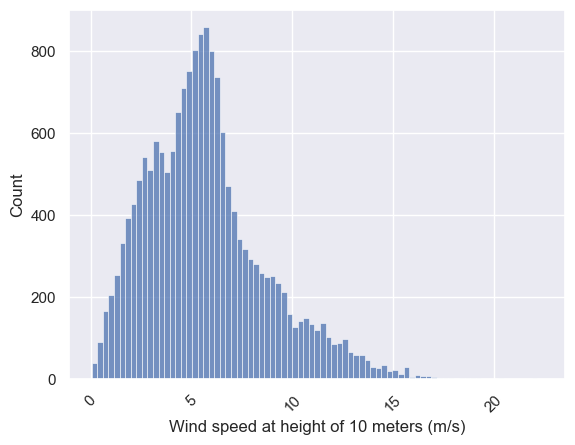

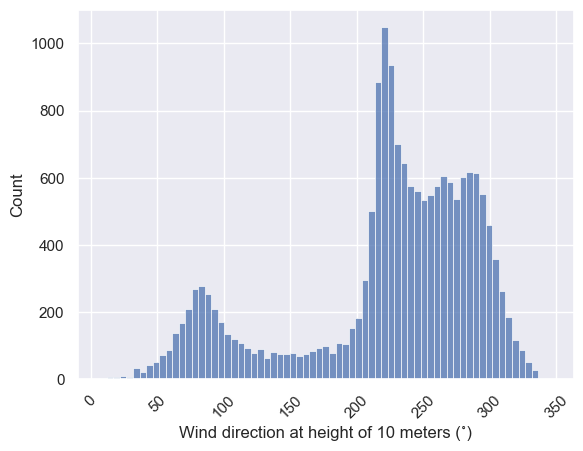

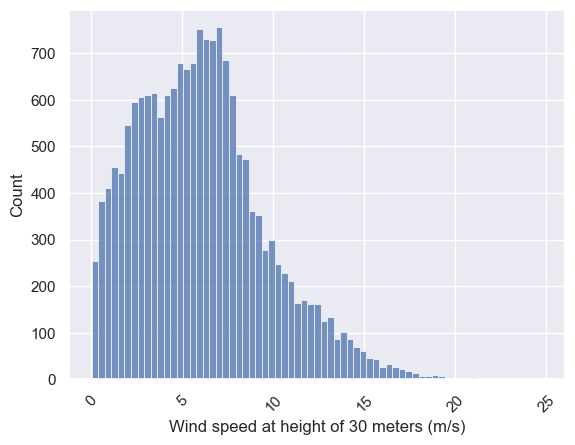

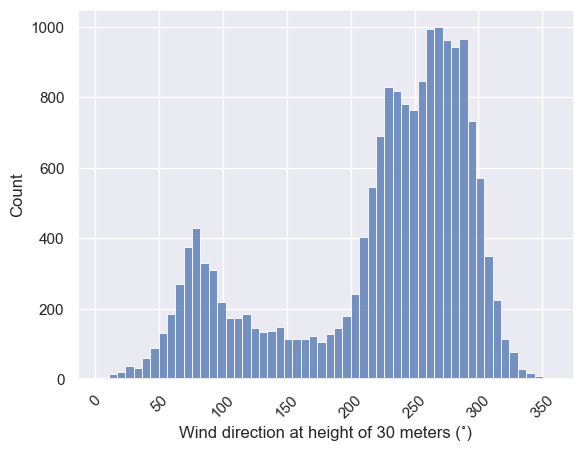

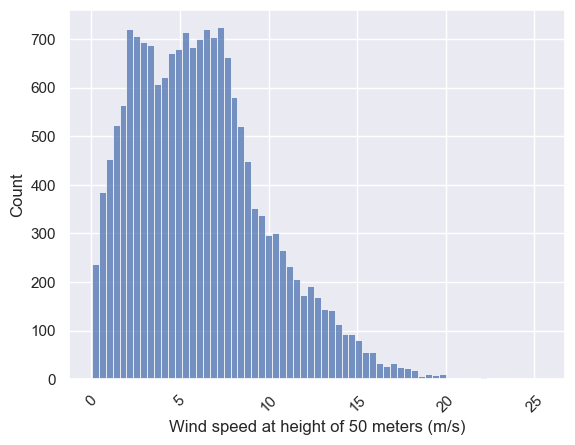

...

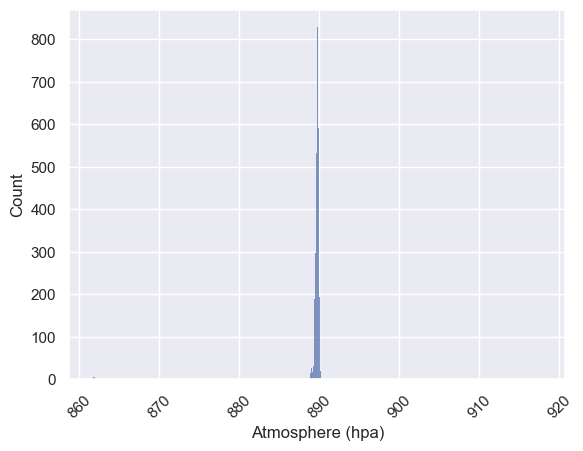

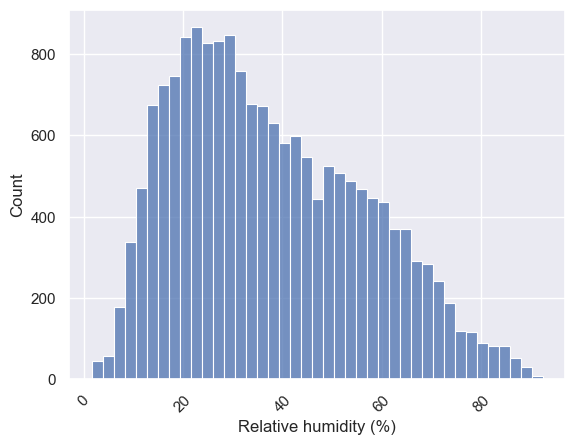

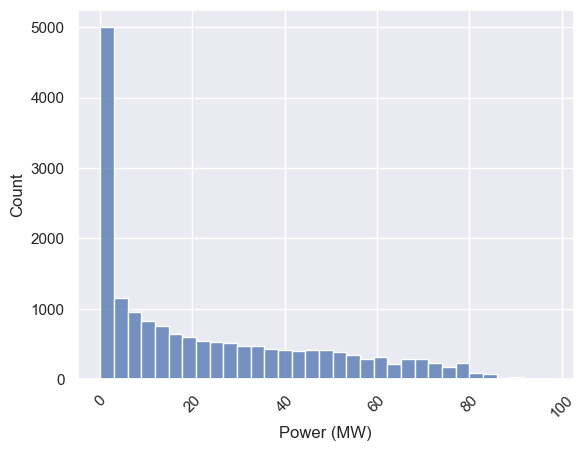

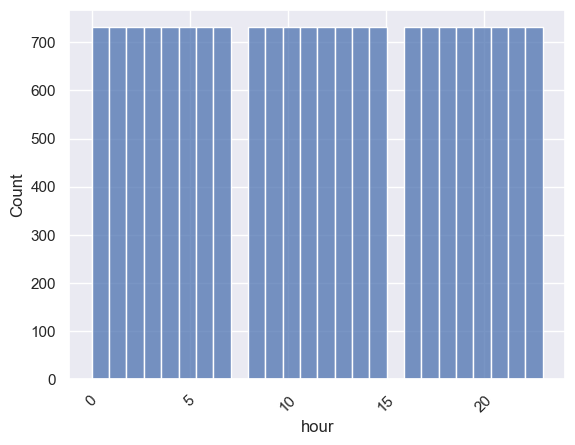

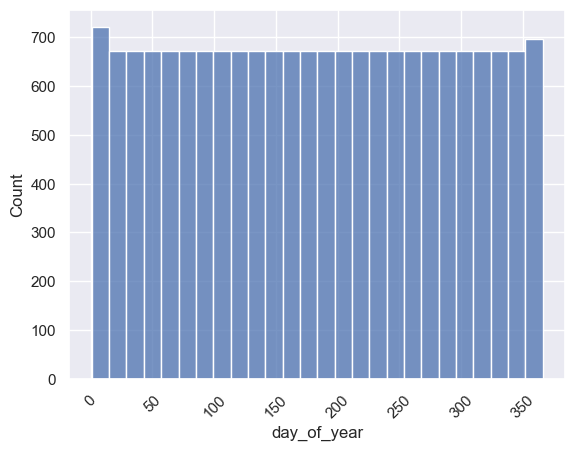

In [10]:
# Configuración del tema de seaborn
sns.set_theme()

# Obtenemos las columnas del DataFrame hourly_data
columns = hourly_data.columns

# Iteramos sobre las columnas y creamos un histograma para cada una
for column in columns:
    sns.histplot(data=hourly_data[column])  # Crear el histograma utilizando seaborn
    plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para una mejor legibilidad
    plt.show()  # Mostrar el histograma


Con los histogramos corroboramos la información planteada anteriormente. Donde todas la variables de velocidad y dirección del viento son muy similares entre sí. Además, comprobamos que las variables de la velocidad presentan una cola a derecha algo alargada, por lo que es posible que tengan valores atípicos.

En el caso de la dirección del viento, los tres histrogramas presentan dos puntas, indicando que hay dos tipos de vientos que son los más predominantes, los cuales estudiaremos a lo largo del docmuento.

En relación a la variable de presión atmosférica, comprobamos como tiene la gran mayoría de valores concentrados en pocos valores, con una desviación típica muy baja tal como nos mostraba los descripción estadística del dataset, por lo que será interesante estudiar porque se dan estos cambios. Mientras, la humedad relativa presenta una distribución bastante similar a la normal.

Finalmente, comentar como la energía genera acumula bastante valores en valores cercanos a 0, con una cola a la derecha.

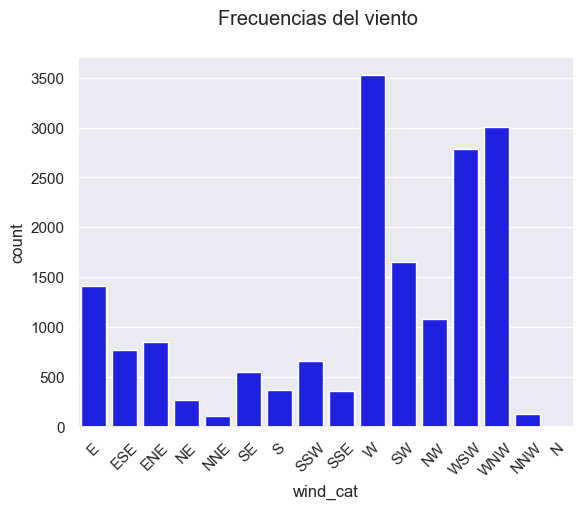

In [11]:
# Función para asignar una categoría de dirección del viento basada en el ángulo
def direction(x):
    if x > 348.75 or x < 11.25: return 'N'
    if x < 33.75: return 'NNE'
    if x < 56.25: return 'NE'
    if x < 78.75: return 'ENE'
    if x < 101.25: return 'E'
    if x < 123.75: return 'ESE'
    if x < 146.25: return 'SE'
    if x < 168.75: return 'SSE'
    if x < 191.25: return 'S'
    if x < 213.75: return 'SSW'
    if x < 236.25: return 'SW'
    if x < 258.75: return 'WSW'
    if x < 281.25: return 'W'
    if x < 303.75: return 'WNW'
    if x < 326.25: return 'NW'
    else: return 'NNW'

# Aplicar la función 'direction' a la columna de dirección del viento y crear una nueva columna 'wind_cat'
hourly_data['wind_cat'] = hourly_data['Wind direction at height of 50 meters (˚)'].apply(direction)

# Graficar un countplot para mostrar las frecuencias de cada categoría de dirección del viento
sns.countplot(data=hourly_data, x='wind_cat', color='blue')
plt.suptitle('Frecuencias del viento')  # Título principal del gráfico
plt.xticks(rotation=45)  # Rotamos las etiquetas del eje x para una mejor legibilidad
plt.show()  # Mostramos el gráfico

Comprobamos como los dos picos de la gráfica de la dirección del viento corresponden el pico más altos a vientos de compoente oeste como (W, WSW y WNW) y el más bajo a vientos de compoenete este (E, ESE y ENE)

In [12]:
# Eliminamos ls columna wind_cat porque ya no la vamos a utilizar
hourly_data.drop(['wind_cat'], axis=1, inplace=True)

##### Diagramas de cajas

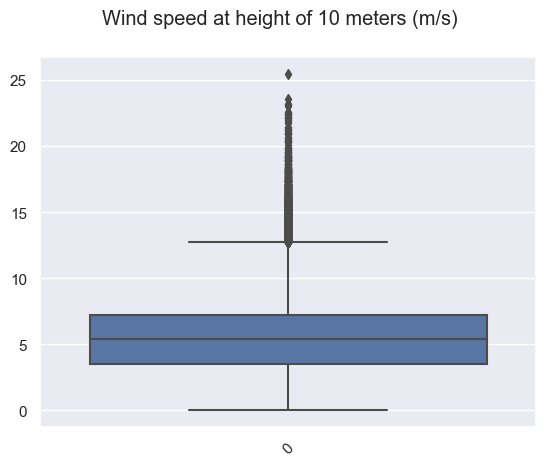

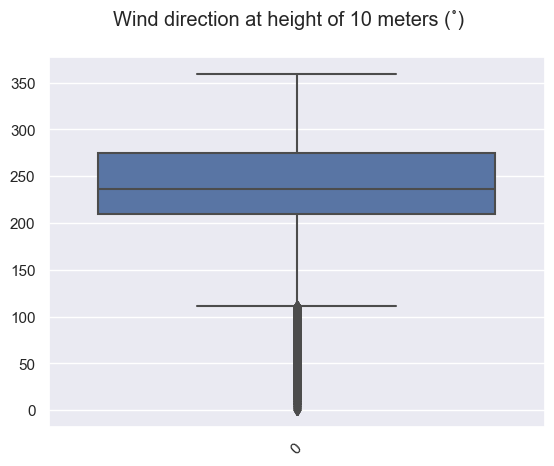

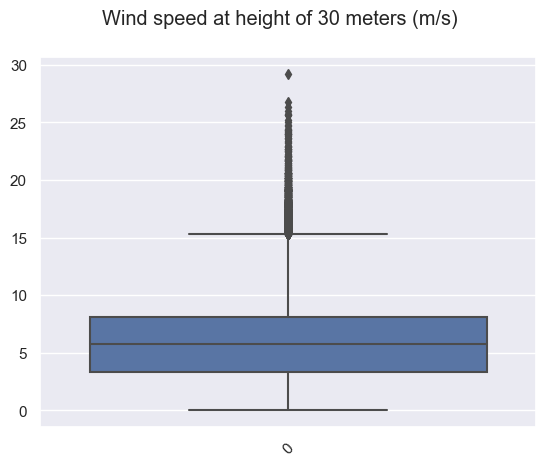

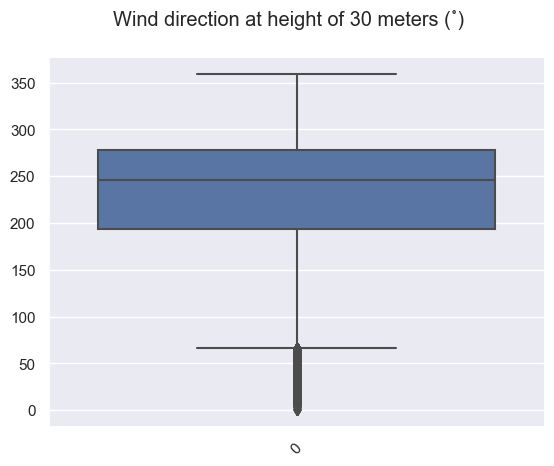

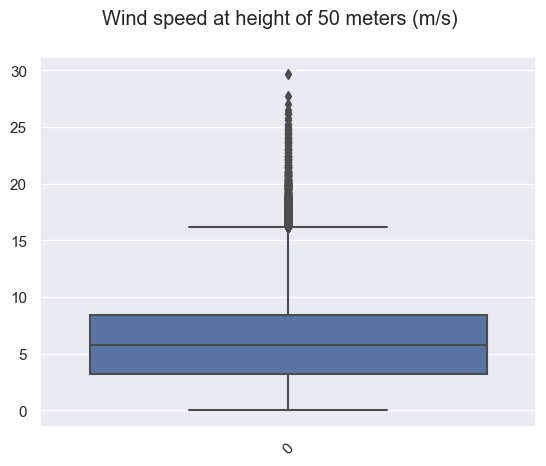

...

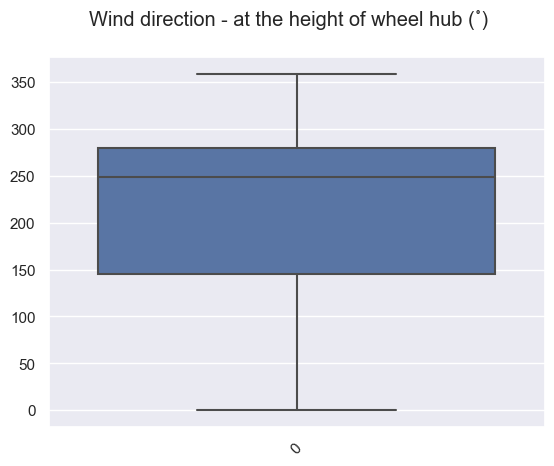

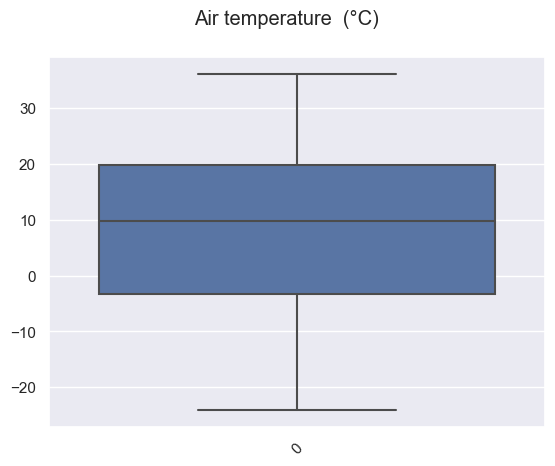

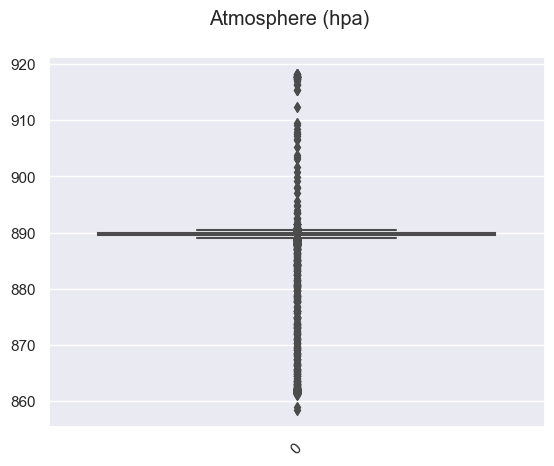

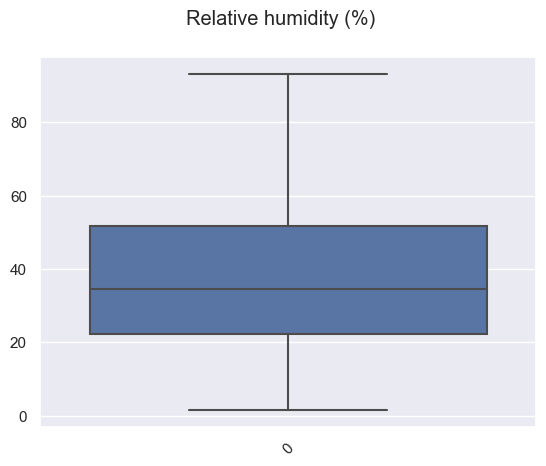

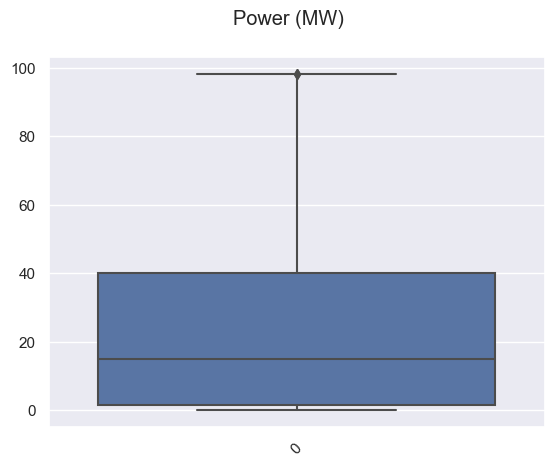

In [13]:
columns = data.columns

for column in columns:
    sns.boxplot(data=data[column])  # Creamos un boxplot para la columna actual
    plt.suptitle(column)  # Título principal del gráfico, usando el nombre de la columna
    plt.xticks(rotation=45)  # Rotamos las etiquetas del eje x para una mejor legibilidad
    plt.show()  # Mostramos el boxplot


Observamos que las variables de velocidad y dirección del viento presentan valores atípicos. Sin embargo, esto es atribuible a la naturaleza misma del viento, que frecuentemente sopla de forma racheada, resultando en valores muy elevados en comparación con la velocidad media. Es importante destacar que la presencia de estos valores atípicos no implica necesariamente que sean incorrectos. Por lo tanto, no se eliminarán ni corregirán.

Finalmente, corroboramos como la gran mayoría de valores de presión atmoférica se concentran en un muy pocos valores, ya que la caja esta muy aplanada.

#### Análisis bivariante
##### Análisis valores atípicos

In [14]:
def upper_outliers(data):
    # Calcular el primer cuartil (Q1) y el tercer cuartil (Q3)
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)

    # Calcular el rango intercuartílico (IQR)
    IQR = Q3 - Q1

    # Calcular el límite superior para los valores atípicos
    return Q3 + 1.5 * IQR

def lower_outliers(data):
    # Calcular el primer cuartil (Q1) y el tercer cuartil (Q3)
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)

    # Calcular el rango intercuartílico (IQR)
    IQR = Q3 - Q1

    # Calcular el límite inferior para los valores atípicos
    return Q1 - 1.5 * IQR


**Velocidad VS Dirección 10m outliers**

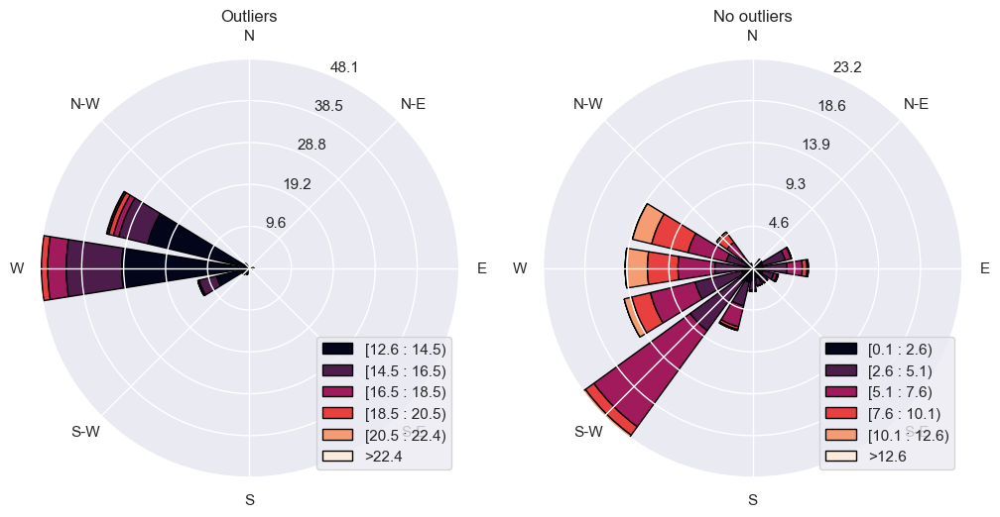

In [15]:
from windrose import WindroseAxes

# Calcular los valores atípicos para la velocidad del viento a 10 metros
out_speed_10m = upper_outliers(hourly_data['Wind speed at height of 10 meters (m/s)'])

# Filtrar los datos para obtener los valores atípicos y los valores normales
df_out_speed_10m = hourly_data[hourly_data['Wind speed at height of 10 meters (m/s)'] > out_speed_10m]
df_in_speed_10m = hourly_data[hourly_data['Wind speed at height of 10 meters (m/s)'] <= out_speed_10m]

# Crear una figura con dos subgráficos para los gráficos de rosas del viento
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection':'windrose'})

# Graficar los valores atípicos en el primer subgráfico
ax1.bar(df_out_speed_10m['Wind direction at height of 10 meters (˚)'], df_out_speed_10m['Wind speed at height of 10 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax1.set_legend()
ax1.legend(loc='lower right')
ax1.title.set_text('Outliers')  # Título del primer subgráfico

# Graficar los valores normales en el segundo subgráfico
ax2.bar(df_in_speed_10m['Wind direction at height of 10 meters (˚)'], df_in_speed_10m['Wind speed at height of 10 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax2.set_legend()
ax2.legend(loc='lower right')
ax2.title.set_text('No outliers')  # Título del segundo subgráfico

plt.show()  # Mostrar los gráficos


**Velocidad VS Dirección 30m**

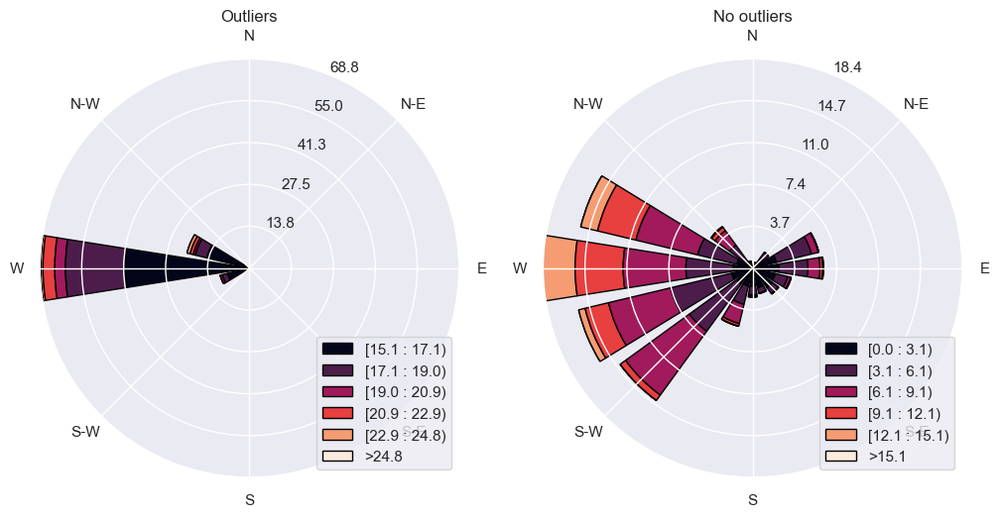

In [16]:
# Calcular el límite superior para identificar valores atípicos en la velocidad del viento a 30 metros
out_speed_30m = upper_outliers(hourly_data['Wind speed at height of 30 meters (m/s)'])

# Filtrar los datos para obtener los valores atípicos y los valores normales de la velocidad del viento a 30 metros
df_out_speed_30m = hourly_data[hourly_data['Wind speed at height of 30 meters (m/s)'] > out_speed_30m]
df_in_speed_30m = hourly_data[hourly_data['Wind speed at height of 30 meters (m/s)'] <= out_speed_30m]

# Crear una figura con dos subgráficos para los gráficos de rosas del viento
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection':'windrose'})

# Graficar los valores atípicos en el primer subgráfico
ax1.bar(df_out_speed_30m['Wind direction at height of 30 meters (˚)'], df_out_speed_30m['Wind speed at height of 30 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax1.set_legend()  # Establecer la leyenda para el primer subgráfico
ax1.legend(loc='lower right')  # Posicionar la leyenda en la esquina inferior derecha
ax1.title.set_text('Outliers')  # Establecer el título del primer subgráfico

# Graficar los valores normales en el segundo subgráfico
ax2.bar(df_in_speed_30m['Wind direction at height of 30 meters (˚)'], df_in_speed_30m['Wind speed at height of 30 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax2.set_legend()  # Establecer la leyenda para el segundo subgráfico
ax2.legend(loc='lower right')  # Posicionar la leyenda en la esquina inferior derecha
ax2.title.set_text('No outliers')  # Establecer el título del segundo subgráfico

plt.show()  # Mostrar los gráficos de rosas del viento


**Velocidad VS Dirección 50m outliers**

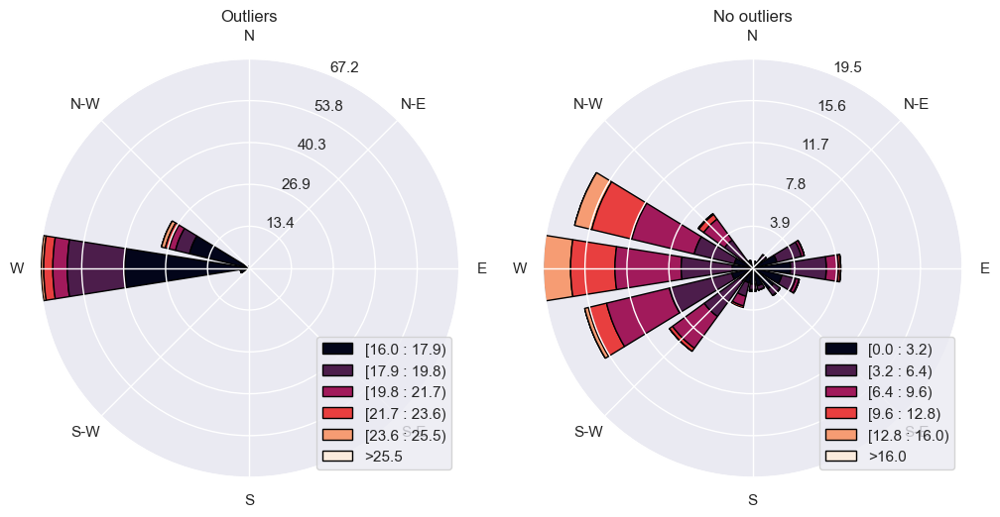

In [17]:
# Calcular el límite superior para identificar valores atípicos en la velocidad del viento a 50 metros
out_speed_50m = upper_outliers(hourly_data['Wind speed at height of 50 meters (m/s)'])

# Filtrar los datos para obtener los valores atípicos y los valores normales de la velocidad del viento a 50 metros
df_out_speed_50m = hourly_data[hourly_data['Wind speed at height of 50 meters (m/s)'] > out_speed_50m]
df_in_speed_50m = hourly_data[hourly_data['Wind speed at height of 50 meters (m/s)'] <= out_speed_50m]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection':'windrose'})


ax1.bar(df_out_speed_50m['Wind direction at height of 50 meters (˚)'], df_out_speed_50m['Wind speed at height of 50 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax1.set_legend()
ax1.legend(loc='lower right')
ax1.title.set_text('Outliers')

ax2.bar(df_in_speed_50m['Wind direction at height of 50 meters (˚)'], df_in_speed_50m['Wind speed at height of 50 meters (m/s)'], normed=True, opening=0.8, edgecolor='black')
ax2.set_legend()
ax2.legend(loc='lower right')
ax2.title.set_text('No outliers')

plt.show()

**Velocidad VS Dirección a la altura de la turbina outliers**

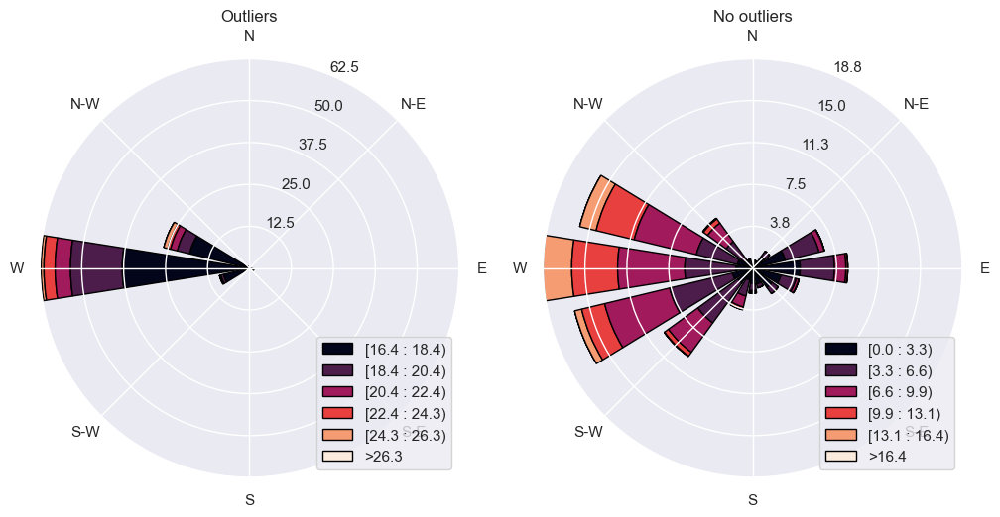

In [18]:
# Calcular el límite superior para identificar valores atípicos en la velocidad del viento a la altura de la turbina
out_speed_wheel_hub = upper_outliers(hourly_data['Wind speed - at the height of wheel hub(m/s)'])

# Filtrar los datos para obtener los valores atípicos y los valores normales de la velocidad del viento a la altura de la turbina
df_out_speed_wheel_hub = hourly_data[hourly_data['Wind speed - at the height of wheel hub(m/s)'] > out_speed_wheel_hub]
df_in_speed_wheel_hub = hourly_data[hourly_data['Wind speed - at the height of wheel hub(m/s)'] <= out_speed_wheel_hub]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection':'windrose'})

# axs = WindroseAxes.from_ax()
ax1.bar(df_out_speed_wheel_hub['Wind direction - at the height of wheel hub (˚)'], df_out_speed_wheel_hub['Wind speed - at the height of wheel hub(m/s)'], normed=True, opening=0.8, edgecolor='black')
ax1.set_legend()
ax1.legend(loc='lower right')
ax1.title.set_text('Outliers')

# axs[0,1] = WindroseAxes.from_ax()
ax2.bar(df_in_speed_wheel_hub['Wind direction - at the height of wheel hub (˚)'], df_in_speed_wheel_hub['Wind speed - at the height of wheel hub(m/s)'], normed=True, opening=0.8, edgecolor='black')
ax2.set_legend()
ax2.legend(loc='lower right')
ax2.title.set_text('No outliers')

plt.show()

En las diversas alturas analizadas, los vientos más fuertes, que no son considerados valores atípicos, provienen principalmente de direcciones como WNW, W, WSW y SW. También se observan vientos de componente E, aunque son menos intensos en comparación. Sin embargo, al examinar las velocidades de viento atípicas, todas se originan desde la dirección W. Por lo tanto, podemos inferir que los valores atípicos son generados por ráfagas de viento importantes que provienen del oeste.

**Presión atmosférica**

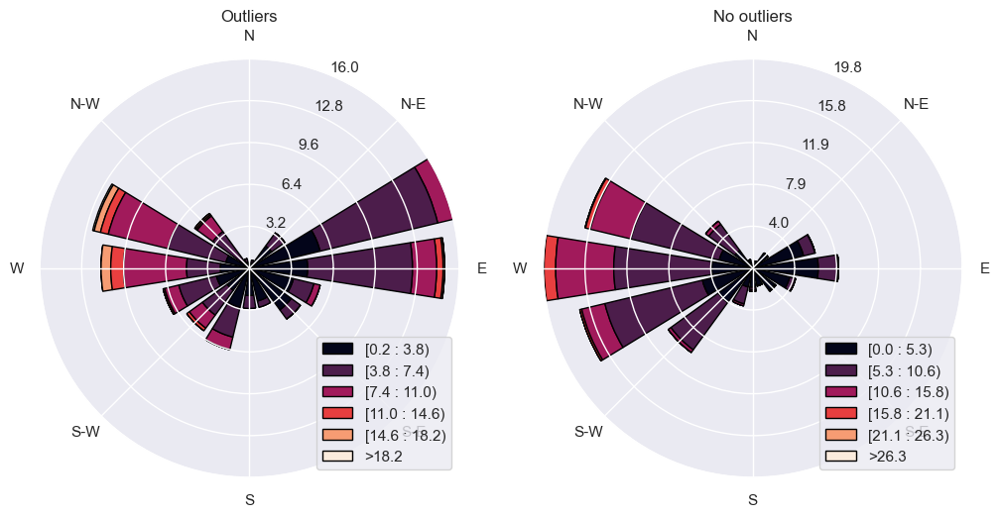

In [19]:
# Calcular los límites superior e inferior para identificar valores atípicos en la presión atmosférica
out_atm_wheel_hub_up = upper_outliers(hourly_data['Atmosphere (hpa)'])
out_atm_wheel_hub_low = lower_outliers(hourly_data['Atmosphere (hpa)'])

# Crear una máscara para identificar los valores atípicos
mask = (hourly_data['Atmosphere (hpa)'] > out_atm_wheel_hub_up) | (hourly_data['Atmosphere (hpa)'] < out_atm_wheel_hub_low)

# Filtrar los datos para obtener los valores atípicos y los valores normales de la presión atmosférica
df_out_atm_wheel_hub = hourly_data[mask]
df_in_atm_wheel_hub = hourly_data[~mask]

# Crear una figura con dos subgráficos para los gráficos de rosas del viento
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection':'windrose'})

# Graficar los valores atípicos en el primer subgráfico
ax1.bar(df_out_atm_wheel_hub['Wind direction - at the height of wheel hub (˚)'], df_out_atm_wheel_hub['Wind speed - at the height of wheel hub(m/s)'], normed=True, opening=0.8, edgecolor='black')
ax1.set_legend()  # Establecer la leyenda para el primer subgráfico
ax1.legend(loc='lower right')  # Posicionar la leyenda en la esquina inferior derecha
ax1.title.set_text('Outliers')  # Establecer el título del primer subgráfico

# Graficar los valores normales en el segundo subgráfico
ax2.bar(df_in_atm_wheel_hub['Wind direction - at the height of wheel hub (˚)'], df_in_atm_wheel_hub['Wind speed - at the height of wheel hub(m/s)'], normed=True, opening=0.8, edgecolor='black')
ax2.set_legend()  # Establecer la leyenda para el segundo subgráfico
ax2.legend(loc='lower right')  # Posicionar la leyenda en la esquina inferior derecha
ax2.title.set_text('No outliers')  # Establecer el título del segundo subgráfico

plt.show()  # Mostrar los gráficos de rosas del viento

Como podemos observar, la mayoría de los vientos que causan valores atípicos en la presión atmosférica son aquellos con componentes ENE y E en lugar de compoenete WNW, W, WSW. Por lo tanto, cuando se presentan estas situaciones de vientos provenientes del este, la presión atmosférica experimenta cambios, lo que sugiere que las condiciones climáticas pueden ser algo distintas. En nuestro caso, como ya habíamos estudiado, estos vientos no suelen ser intensos, por lo que es posible que durante períodos de viento del este no generemos una cantidad significativa de energía eólica.

##### Correlaciones

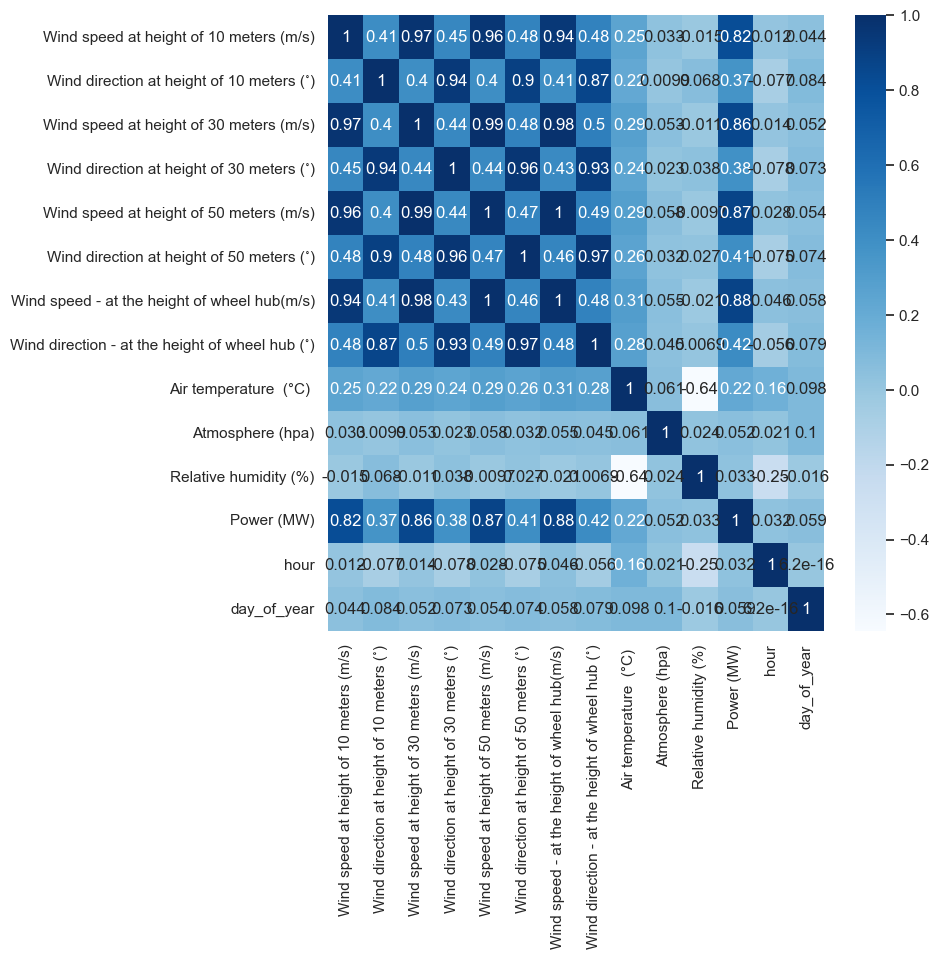

In [20]:
# Crear una figura con el tamaño específico
figure = plt.figure(figsize=(8, 8))

# Crear un mapa de calor de la matriz de correlación, con anotaciones y usando una paleta de colores de tonos azules
sns.heatmap(hourly_data.corr(), annot=True, cmap=plt.cm.Blues)

# Mostrar el mapa de calor
plt.show()


Como era de esperar todas las variables de dirección y velocidad de viento presentan una alta correlación entre ellas respectivamente, por tanto, aunque aún no lo hemos comprobado estadísticamente es muy posible que presenten multicolinearidad. Sin embargo, el par de variables que más correlación tienen con la variable objetivo, son la velocidad y dirección del viento a la altura de la turbina, por tanto, es posible que sean buenas candidatas para introducir en el modelo. 

Finalmente, la temperatura atmosférica presenta una correlación media baja de 0.22 con la variable objetivo. Mientras que, el resto de variables no parecen tener correlación la cantidad de energía generada.

c:\Users\josor\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


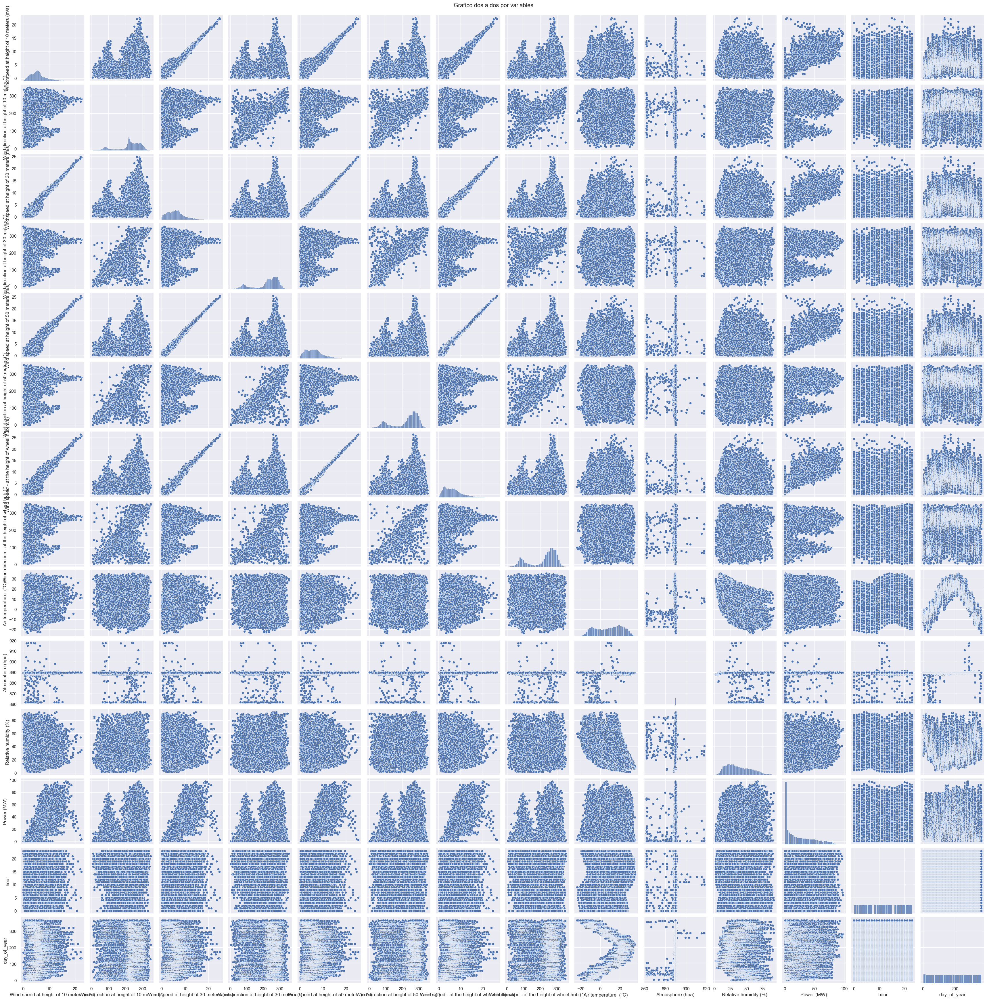

In [21]:
# Relizamos el gráfico dos a dos
g = sns.pairplot(hourly_data)

# Indicamos el título
g.figure.suptitle("Grafíco dos a dos por variables", y=1)
plt.show()

De este estudio podmeos extraer una serie de conclusiones:
- La velocidad del viento tiene una correlación muy alta con la energía generada por lo que será una variable interesante de introducir en el modelo.
- La varibales de velocidad y dirección es posible que presente multicolinearidad entre ellas.
- La direcciones del viento más predominetas e intensas son las prevenientes del oeste.
- La humedad relativa y la temperatura paracen no tener un correlación con la energía genera, pero ¿tendrán algún tipo de relación?
- ¿Hay momentos del día en los que se genera más energía que otros?

**¿Cuándo se genera más energía eólica?**

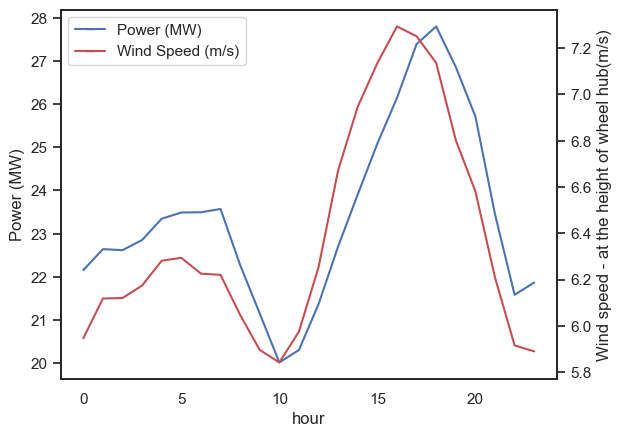

In [22]:
from matplotlib.lines import Line2D

# Configurar el estilo de seaborn
sns.set_theme(style='white')

# Crear el primer gráfico de líneas para la potencia promedio por hora
g = sns.lineplot(data=hourly_data[["hour", "Power (MW)"]].groupby("hour").mean(), x="hour", y="Power (MW)")

# https://stackoverflow.com/questions/47591650/second-y-axis-time-series

# Agregar el segundo gráfico de líneas para la velocidad del viento promedio por hora, utilizando un eje yuxtapuesto
sns.lineplot(data=hourly_data[["hour", "Wind speed - at the height of wheel hub(m/s)"]].groupby("hour").mean(), x="hour", y="Wind speed - at the height of wheel hub(m/s)", color="r", ax=g.axes.twinx())

# Personalizar la leyenda con colores específicos para cada línea
g.legend(handles=[Line2D([], [], marker='_', color="b", label='Power (MW)'), Line2D([], [], marker='_', color="r", label='Wind Speed (m/s)')])

# Mostrar el gráfico
plt.show()


Si comparamos las velocidad del viento en la turbina con la energía generada, podemos ver como van al únisono, corroborando la alta correlación que hay entre ellas.

De hecho se puede apreciar, como a las 10 de la mañana hay un bajón en el aire y como a partir de las desde entonces aumenta hasta tener un pico entre las 17-18 de la tarde.

**Relaciones no lineales**

In [23]:
# Añadir una nueva columna 'month' que indica el mes correspondiente a cada registro
hourly_data.loc[:, 'month'] = hourly_data.index.month_name()

# Diccionario que asigna una estación a cada mes
season_dict = {'January': 'Winter',
               'February': 'Winter',
               'March': 'Spring', 
               'April': 'Spring',
               'May': 'Spring',
               'June': 'Summer',
               'July': 'Summer',
               'August': 'Summer',
               'September': 'Fall',
               'October': 'Fall',
               'November': 'Fall',
               'December': 'Winter'}

# Añadir una nueva columna 'season' que indica la estación correspondiente a cada mes
hourly_data.loc[:, 'season'] = hourly_data['month'].apply(lambda x: season_dict[x])


##### Presión atmoférica

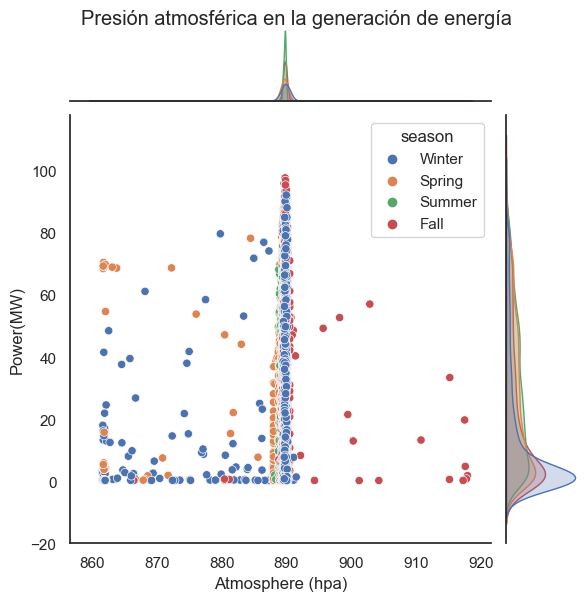

In [24]:
# Se crea un gráfico de dispersión conjunto (jointplot) utilizando seaborn
# Se utiliza filtered_data como el conjunto de datos
# x="Atmosphere (hpa)" indica que "Atmosphere (hpa)" será el eje x del gráfico
# y="Power (MW)" indica que "Power (MW)" será el eje y del gráfico
# hue='season' permite diferenciar las observaciones por estación utilizando diferentes colores
g = sns.jointplot(data=hourly_data, x="Atmosphere (hpa)", y="Power (MW)", hue='season')

# Se establecen las etiquetas de los ejes x e y del gráfico
g.set_axis_labels(xlabel=("Atmosphere (hpa)"), ylabel=("Power(MW)")) 

# Se establece el título de la figura
g.figure.suptitle("Presión atmosférica en la generación de energía", y=1)

# Se muestra el gráfico de dispersión conjunto
plt.show()

Se puede comprobar como la presión atmosférica es es prácticamente igual durante todo el año, salvo por uno pocos datos de invierno y primavera que son más bajas de lo normal y otros de otoño que están por encima. Pero cabe concluir que con este gráfico se pueden extraer pocas conclusiones.

##### Temperatura del aire

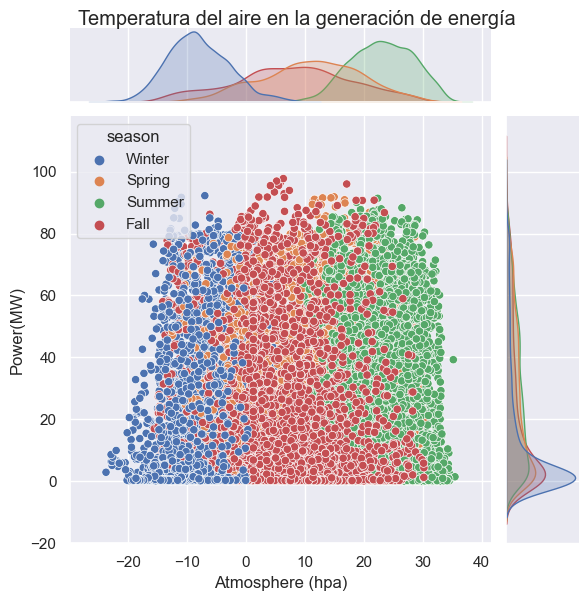

In [25]:
# Configurar el estilo de seaborn
sns.set_theme()

# Se crea un gráfico de dispersión conjunto (jointplot) utilizando seaborn
# Se utiliza filtered_data como el conjunto de datos
# x="Atmosphere (hpa)" indica que "Atmosphere (hpa)" será el eje x del gráfico
# y="Power (MW)" indica que "Power (MW)" será el eje y del gráfico
# hue='season' permite diferenciar las observaciones por estación utilizando diferentes colores
g = sns.jointplot(data=hourly_data, x="Air temperature  (°C) ", y="Power (MW)", hue='season')

# Se establecen las etiquetas de los ejes x e y del gráfico
g.set_axis_labels(xlabel=("Atmosphere (hpa)"), ylabel=("Power(MW)")) 

# Se establece el título de la figura
g.figure.suptitle("Temperatura del aire en la generación de energía", y=1)

# Se muestra el gráfico de dispersión conjunto
plt.show()

En en el caso de la temperatura, también vemos como no exite una relación lineal. Sin embargo, es más evidente como la temperaturas bajas se concentran durante el invierno (azul), como durante la otoño (rojo) y primavera (naranja), se dan la temperaturas más templadas y en verano (verde) las más altas.

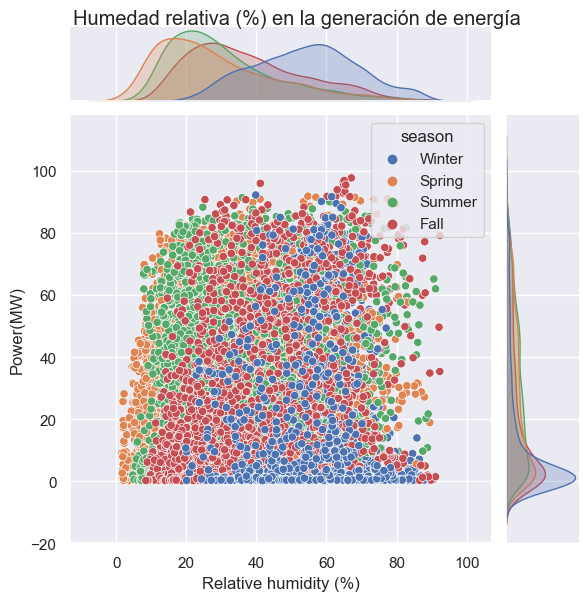

In [26]:
# Se crea un gráfico de dispersión conjunto (jointplot) utilizando seaborn
# Se utiliza filtered_data como el conjunto de datos
# x="Relative humidity (%)" indica que "Relative humidity (%)" será el eje x del gráfico
# y="Power (MW)" indica que "Power (MW)" será el eje y del gráfico
# hue='season' permite diferenciar las observaciones por estación utilizando diferentes colores
g = sns.jointplot(data=hourly_data, x="Relative humidity (%)", y="Power (MW)", hue='season')

# Se establecen las etiquetas de los ejes x e y del gráfico
g.set_axis_labels(xlabel=("Relative humidity (%)"), ylabel=("Power(MW)")) 

# Se establece el título de la figura
g.figure.suptitle("Humedad relativa (%) en la generación de energía", y=1)

# Se muestra el gráfico de dispersión conjunto
plt.show()

En el caso de la humedad relativa podemos ver claremente como se ditribuyen de manera bastente uniforme. Sin embargo, solamente el invierno se diferencia con valores más altos de humedad. El resto de estacioens tienen valores similares.

#### Multicolinearidad

Como observamos en la tabla de correlaciones, es posible que puede existir multicolinearidad entre nuestras variables. Para comprobarlo vamos a calcular los valores VIF, los cuales si son mayores de 10 indica que esa variables puede provocar multicolinearidad.

In [27]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

# Crear un DataFrame para almacenar los resultados del VIF
vif_data = pd.DataFrame() 

# Seleccionar las características para calcular el VIF
X = hourly_data.drop(['Power (MW)', 'hour', 'day_of_year', 'season', 'month'], axis=1)

# Añadir el nombre de las características al DataFrame vif_data
vif_data["feature"] = X.columns 
  
# Calcular el VIF para cada característica
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                   for i in range(len(X.columns))] 
  
# Imprimir los resultados del VIF
print(vif_data)


                                            feature          VIF
0           Wind speed at height of 10 meters (m/s)   122.487957
1         Wind direction at height of 10 meters (˚)   108.487609
2           Wind speed at height of 30 meters (m/s)   952.971666
3         Wind direction at height of 30 meters (˚)   196.820573
4           Wind speed at height of 50 meters (m/s)  2058.081075
5         Wind direction at height of 50 meters (˚)   249.342886
6      Wind speed - at the height of wheel hub(m/s)   766.013892
7   Wind direction - at the height of wheel hub (˚)   133.354643
8                            Air temperature  (°C)      3.093756
9                                  Atmosphere (hpa)    18.535176
10                            Relative humidity (%)     9.741526


In [28]:
# Crear un DataFrame para almacenar los resultados del VIF
vif_data = pd.DataFrame() 

# Seleccionar las características para calcular el VIF
X = hourly_data.drop(['Power (MW)', 'hour', 'day_of_year', 'season', 'month', 'Wind speed at height of 50 meters (m/s)'], axis=1)

# Añadir el nombre de las características al DataFrame vif_data
vif_data["feature"] = X.columns 
  
# Calcular el VIF para cada característica
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                   for i in range(len(X.columns))] 
  
# Imprimir los resultados del VIF
print(vif_data)


                                           feature         VIF
0          Wind speed at height of 10 meters (m/s)  106.567173
1        Wind direction at height of 10 meters (˚)  107.796246
2          Wind speed at height of 30 meters (m/s)  326.548474
3        Wind direction at height of 30 meters (˚)  196.547486
4        Wind direction at height of 50 meters (˚)  247.734242
5     Wind speed - at the height of wheel hub(m/s)  153.018472
6  Wind direction - at the height of wheel hub (˚)  133.354156
7                           Air temperature  (°C)     3.076531
8                                 Atmosphere (hpa)   18.305105
9                            Relative humidity (%)    9.707635


In [29]:
# Crear un DataFrame para almacenar los resultados del VIF
vif_data = pd.DataFrame() 

# Seleccionar las características para calcular el VIF
X = hourly_data.drop(['Power (MW)', 'hour', 'day_of_year', 'season', 'month', 
                      'Wind speed at height of 50 meters (m/s)', 'Wind speed at height of 30 meters (m/s)', 
                      'Wind direction at height of 50 meters (˚)', 'Wind direction at height of 30 meters (˚)', 
                      'Wind speed at height of 10 meters (m/s)', 'Wind direction at height of 10 meters (˚)', 
                      'Atmosphere (hpa)'], axis=1)

# Añadir el nombre de las características al DataFrame vif_data
vif_data["feature"] = X.columns 
  
# Calcular el VIF para cada característica
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                   for i in range(len(X.columns))] 
  
# Imprimir los resultados del VIF
print(vif_data)


                                           feature       VIF
0     Wind speed - at the height of wheel hub(m/s)  5.284950
1  Wind direction - at the height of wheel hub (˚)  9.095284
2                           Air temperature  (°C)   2.481208
3                            Relative humidity (%)  5.285238


In [30]:
# Eliminar las columnas especificadas del DataFrame hourly_data
hourly_data.drop(['hour', 'day_of_year', 'season', 'month', 'Wind speed at height of 50 meters (m/s)', 
                  'Wind speed at height of 30 meters (m/s)', 'Wind direction at height of 50 meters (˚)',
                  'Wind direction at height of 30 meters (˚)', 'Wind speed at height of 10 meters (m/s)', 
                  'Wind direction at height of 10 meters (˚)', 'Atmosphere (hpa)'], axis=1, inplace=True)

# Mostrar las primeras filas del DataFrame después de eliminar las columnas
hourly_data.head()

,Wind speed - at the height of wheel hub(m/s),Wind direction - at the height of wheel hub (˚),Air temperature (°C),Relative humidity (%),Power (MW)
Time,,,,,
2019-01-01 00:00:00,2.38350,77.53750,-13.65800,76.71975,0.266995
2019-01-01 01:00:00,2.60875,99.95000,-13.89825,71.68000,0.194340
2019-01-01 02:00:00,2.41725,92.81675,-14.15350,74.80000,0.278187
2019-01-01 03:00:00,2.09600,101.76675,-14.09500,70.94125,0.625121
2019-01-01 04:00:00,1.77050,86.57500,-14.22325,67.81350,0.286536


### Estacionalidad
#### Test de Dickey-Fuller

In [31]:
from statsmodels.tsa.stattools import adfuller

# Diccionario para almacenar los resultados de la prueba ADF
adfull = {}

# Iterar sobre cada columna en hourly_data
for column in hourly_data.columns:
    # Obtener los valores de la columna actual
    X = hourly_data[column].values
    # Realizar la prueba ADF
    result = adfuller(X)
    # Almacenar el valor p en el diccionario adfull
    adfull[column] = [result[1]]

    # Imprimir el valor p para la columna actual
    print('P-value para {}: {}'.format(column, result[1]))


P-value para Wind speed - at the height of wheel hub(m/s): 3.543733265108568e-25
P-value para Wind direction - at the height of wheel hub (˚): 1.7329126607366352e-28
P-value para Air temperature  (°C) : 0.11016806499990073
P-value para Relative humidity (%): 1.3344392092764153e-11
P-value para Power (MW): 2.9442372391632654e-26


Como el p-valor de la variable Air temperature, podemos concluir de que no es estacionaria, por lo que optamos por no incluirla en el modelo

In [32]:
# Se elimina la columna de la temperatura
hourly_data.drop('Air temperature  (°C) ', axis=1, inplace=True)

In [33]:
# Dataset final
hourly_data.head()

,Wind speed - at the height of wheel hub(m/s),Wind direction - at the height of wheel hub (˚),Relative humidity (%),Power (MW)
Time,,,,
2019-01-01 00:00:00,2.38350,77.53750,76.71975,0.266995
2019-01-01 01:00:00,2.60875,99.95000,71.68000,0.194340
2019-01-01 02:00:00,2.41725,92.81675,74.80000,0.278187
2019-01-01 03:00:00,2.09600,101.76675,70.94125,0.625121
2019-01-01 04:00:00,1.77050,86.57500,67.81350,0.286536


In [34]:
# Mostramos las columnas y filas del dataset final
print(f'El dataset tiene {hourly_data.shape[0]} filas y {hourly_data.shape[1]} columnas')

El dataset tiene 17544 filas y 4 columnas


In [35]:
# Guardamos los datos en documento csv
hourly_data.to_csv('data/EO_data.csv')

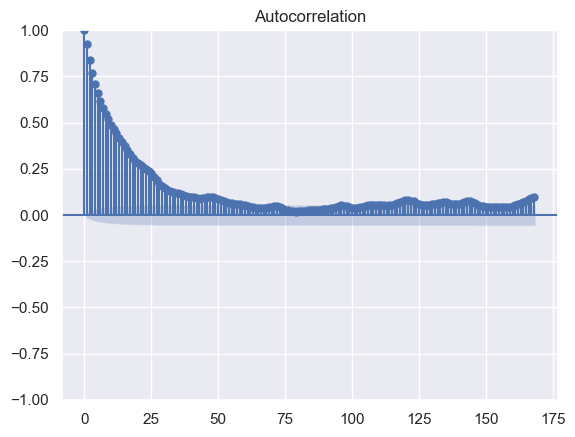

In [36]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

plot_acf(hourly_data['Power (MW)'], lags=24*7)
plt.show()

Podemos ver como en 168 (horas) tenemos el punto mas alto del pico, por lo que será el valor empleado para encontrar tendencias en la enegía fotvoltaica

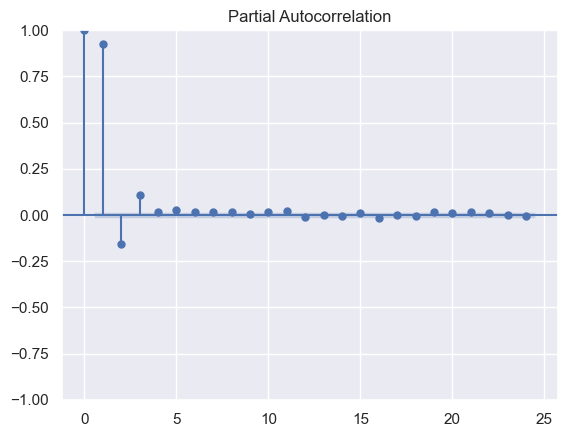

In [37]:
plt.figsize=(20,5)
plot_pacf(hourly_data['Power (MW)'], lags=24)
plt.show()